### Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from keras.datasets import mnist # MNIST dataset is included in Keras


### Load Dataset

In [2]:
# The MNIST data is split between 60,000 training images and 10,000 test image
(X_train, y_train), (X_test, y_test) = mnist.load_data()

print("X_train shape", X_train.shape)
print("y_train shape", y_train.shape)
print("X_test shape", X_test.shape)
print("y_test shape", y_test.shape)

X_train shape (60000, 28, 28)
y_train shape (60000,)
X_test shape (10000, 28, 28)
y_test shape (10000,)


### Display Mnist Data

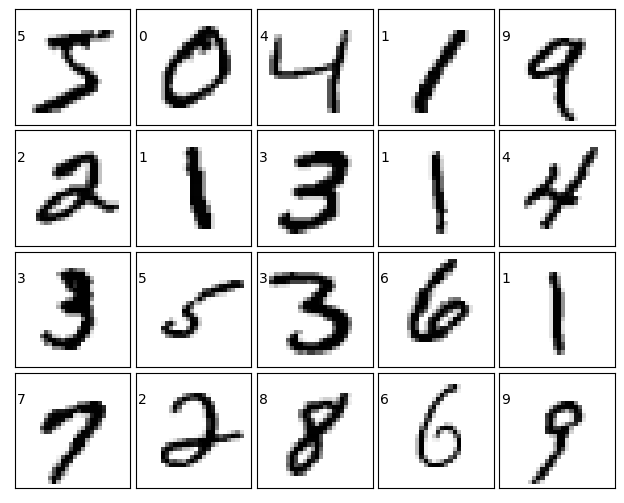

In [3]:
fig = plt.figure(figsize=(6, 6))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)

for i in range(20):
    ax = fig.add_subplot(5, 5, i + 1, xticks=[], yticks=[])
    ax.imshow(X_train[i], cmap=plt.cm.binary, interpolation='nearest')
    # label the image with the target value
    ax.text(0, 7, str(y_train[i]))


### Preprocessing Data

In [4]:
# Reshaping the dataset  60000*768
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1]**2) 

# Change integers to 32-bit floating point numbers
X_train = X_train.astype('float32')   

print("Training matrix shape", X_train.shape)

Training matrix shape (60000, 784)


In [5]:
# Apply standarization to both train and test data
from sklearn.preprocessing import StandardScaler
X_train = StandardScaler().fit_transform(X_train)

In [6]:
print(f"After standarization mean = {X_train.mean().round() }")
print(f"After standarization variance = {X_train.var().round()}")

After standarization mean = -0.0
After standarization variance = 1.0


### TSNE

In [8]:
# initializing the pca
from sklearn.manifold import TSNE

In [20]:
tsne = TSNE(n_components=2)
tsne.fit(X_train)

TSNE()

In [21]:
train_img =tsne.embedding_

print(f'train_img shape : {train_img.shape}')

train_img shape : (60000, 2)


### Visualization 

In [22]:
import pandas as pd
df = pd.DataFrame(train_img, columns = ['tsne_1', 'tsne_2'])

In [23]:
df['label' ] = y_train

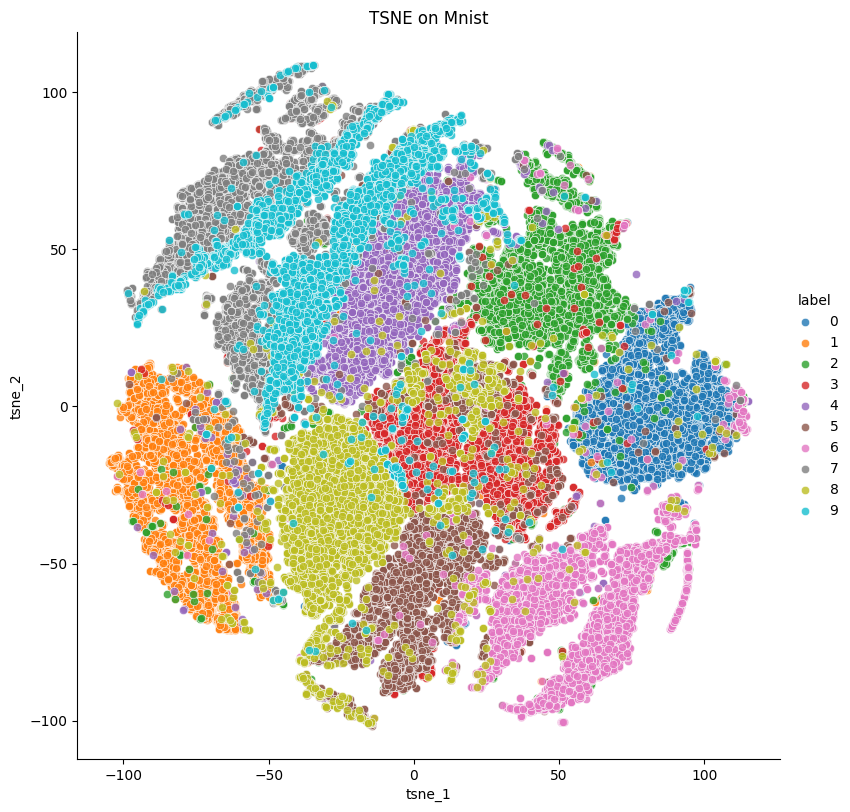

In [24]:

fig = sns.FacetGrid(df, hue = 'label', height = 8)
fig.map(sns.scatterplot, 'tsne_1', 'tsne_2', alpha = 0.8)
fig.add_legend()
fig.set(title = "TSNE on Mnist")
plt.show()


### Observation

    1. The separations are much clearer than PCA.
    2. Except for (4,9) and (3,8) everything is well separated.
    3. (4,9) and (3,8) not being separated can be understood

### Using 3 components 

In [29]:
tsne = TSNE(n_components=3)
tsne.fit(X_train)

TSNE(n_components=3)

In [30]:
train_img = tsne.embedding_

print(f'train_img shape : {train_img.shape}')

train_img shape : (60000, 3)


In [31]:
import pandas as pd
df = pd.DataFrame(train_img, columns = ['tsne_1', 'tsne_2', 'tsne_3'])
df['label' ] = y_train

In [32]:
import plotly.express as px

fig = px.scatter_3d(df, x='tsne_1', y='tsne_2', z='tsne_3',
              color='label')
fig.update_traces(marker_size = 5)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()